## Delivery Price 2015-2018: $p^d$
Raw data available from [RTE](http://clients.rte-france.com/lang/fr/clients_producteurs/vie/volume_journalier_energie_ajustement.jsp?typeoffre=A83). The prices for up and down regulation are identical. The delivery price was constant at 1.05cts/kWh during 2015. From Jan 1st to March 31st 2016, it was 1.06cts/kWh. There is no data available from April 1st to June 16th 2016. Since the availability price recorded during this period is positive, we assume that there was a market for primary frequency regulation with zero delivery price. From June 17th 2016 onwards, the price has been time-varying and reached extremely high values in November 2016. Negative prices have been observed in January 2018. Since the introduction of time-varying pricing, the delivery price has *increased* on average. According to [RTE](http://clients.rte-france.com/htm/fr/offre/telecharge/20181026_Regles_services_systeme_frequence.pdf), the delivery price follows the French spot market price.

In [1]:
import pandas as pd
import numpy as np
from datetime import datetime, timedelta

df_raw = pd.DataFrame()
# Excel files downloaded from RTE
fnames = ["Delivery_2015.xlsx", "Delivery_2016.xlsx", "Delivery_2017.xlsx", "Delivery_2018.xlsx"]
for fname in fnames:
    df_new = pd.read_excel(fname, decimal=',')
    # rename columns
    df_new.columns = df_new.iloc[0,:]
    # remove first row
    df_new = df_new.iloc[1:]
    # consider only primary regulation and up regulation (since there is no price difference between up and down regulation)
    df_new = df_new[(df_new['Type de réserve']=='Réserve primaire') & (df_new['Sens de l\'ajustement']=='A la hausse')]
    # reformat time
    t = []
    for k in range(len(df_new.index)):
        t.append(datetime.combine(df_new.iloc[k,0].date(), \
                                  datetime.strptime(df_new.iloc[k,1][0:5], '%H:%M').time()))
    df_new['Date'] = t
    df_new.drop(columns = 'Heures',inplace=True)
    df_new.rename(columns={'Date': 'Time'}, inplace = True)
    df_raw = df_raw.append(df_new, ignore_index=True)

In [2]:
# Data Consolidation: convert the price to €/kW/h and keep only the time and the price column
df_raw = df_raw[['Time','Prix des offres activées (en euros/MWh)']]
df_raw.rename(columns={'Prix des offres activées (en euros/MWh)': 'pd'}, inplace=True)
df_raw.set_index('Time', inplace=True)
# make a copy for the completed dataframe
df = df_raw.copy(deep=True)
# the missing prices are marked by *
df_raw['pd'].replace('*', np.NaN, inplace=True)
df['pd'].replace('*', 0, inplace=True)
df_raw['pd'] = df_raw['pd'].apply(lambda x: float(x)/1000)
df['pd'] = df['pd'].apply(lambda x: float(x)/1000)
# Data Completion: complete missing data by the nearest available data.
df = df.reindex(pd.date_range('01-01-2015 00:00:00', '12-31-2018 23:30:00', freq='30min'), method='nearest')

Plot the delivery price

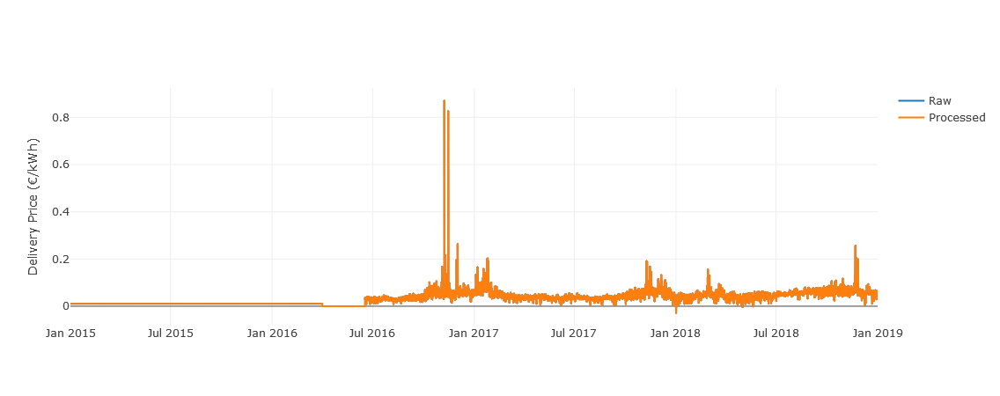

In [3]:
import plotly
import plotly.graph_objs as go
plotly.offline.init_notebook_mode(connected=True)
plotly.offline.iplot({
    "data": [go.Scatter(x=df_raw.index, y=df_raw['pd'], name='Raw'), go.Scatter(x=df.index, y=df['pd'], name='Processed')], 
    "layout": go.Layout(yaxis=dict(title="Delivery Price (€/kWh)"))
})

Save data

In [4]:
df.to_hdf('pd.h5', key='df')